# Decision Tree Classifier on Amazon Fine Food Reviews

In [2]:
from sklearn.tree import DecisionTreeClassifier
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

from nltk.corpus import stopwords
from gensim.models import Word2Vec

from sklearn.preprocessing import StandardScaler
from tqdm import tqdm

from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score

from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

In [3]:
con = sqlite3.connect('database.sqlite')

In [4]:
filtered_data=pd.read_sql_query("""Select * FROM Reviews WHERE Score !=3 LIMIT 5000 """,con)

In [5]:
filtered_data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [6]:
def partition(x):
    if x<3:
        return 0
    return 1
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition)
filtered_data['Score'] = positiveNegative

In [7]:
filtered_data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,0,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,1,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [8]:
print("Number of data points in our data", filtered_data.shape)

Number of data points in our data (5000, 10)


In [9]:
sorted_data=filtered_data.sort_values('ProductId',axis=0,ascending=True,kind='quicksort', na_position='last')

In [10]:
type(sorted_data)

pandas.core.frame.DataFrame

In [11]:
final = sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"},keep='first',inplace = False)

In [12]:
len(final)

4986

In [13]:
display = pd.read_sql_query("""Select * From Reviews Where Score!=3 and HelpfulnessNumerator > HelpfulnessDenominator""",con)

In [14]:
display

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...
1,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...


In [15]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [16]:
print(final.shape)

(4986, 10)


In [17]:
sent_0 = final['Text'].values[0]
print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br />http://www.amazon.com/VICTOR-FLY-MAGNET-BAIT-REFILL/dp/B00004RBDY<br /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [18]:
#Removing html tags

In [19]:
import re
sent_0 = re.sub(r"http\S+", "", sent_0)

In [20]:
print(sent_0)

Why is this $[...] when the same product is available for $[...] here?<br /> /><br />The Victor M380 and M502 traps are unreal, of course -- total fly genocide. Pretty stinky, but only right nearby.


In [21]:
soup = BeautifulSoup(sent_0, 'lxml')

In [22]:
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [23]:
stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [24]:
from tqdm import tqdm

preprocessed_reviews = []
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|████████████████████████████████████████████████████████████████████████████| 4986/4986 [00:03<00:00, 1376.31it/s]


In [25]:
preprocessed_reviews[1500]

'wow far two two star reviews one obviously no idea ordering wants crispy cookies hey sorry reviews nobody good beyond reminding us look ordering chocolate oatmeal cookies not like combination not order type cookie find combo quite nice really oatmeal sort calms rich chocolate flavor gives cookie sort coconut type consistency let also remember tastes differ given opinion soft chewy cookies advertised not crispy cookies blurb would say crispy rather chewy happen like raw cookie dough however not see taste like raw cookie dough soft however confusion yes stick together soft cookies tend not individually wrapped would add cost oh yeah chocolate chip cookies tend somewhat sweet want something hard crisp suggest nabiso ginger snaps want cookie soft chewy tastes like combination chocolate oatmeal give try place second order'

In [26]:
len(preprocessed_reviews)

4986

In [27]:
type(preprocessed_reviews)

list

In [28]:
filtered_data.shape

(5000, 10)

In [29]:
# Adding preprocessed text to the original dataframe

In [30]:
final['preprocessed reviews'] = preprocessed_reviews

In [31]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,preprocessed reviews
2546,2774,B00002NCJC,A196AJHU9EASJN,Alex Chaffee,0,0,1,1282953600,thirty bucks?,Why is this $[...] when the same product is av...,product available victor traps unreal course t...
2547,2775,B00002NCJC,A13RRPGE79XFFH,reader48,0,0,1,1281052800,Flies Begone,We have used the Victor fly bait for 3 seasons...,used victor fly bait seasons ca not beat great...
1145,1244,B00002Z754,A3B8RCEI0FXFI6,B G Chase,10,10,1,962236800,WOW Make your own 'slickers' !,I just received my shipment and could hardly w...,received shipment could hardly wait try produc...
1146,1245,B00002Z754,A29Z5PI9BW2PU3,Robbie,7,7,1,961718400,Great Product,This was a really good idea and the final prod...,really good idea final product outstanding use...
2942,3204,B000084DVR,A1UGDJP1ZJWVPF,"T. Moore ""thoughtful reader""",1,1,1,1177977600,Good stuff!,I'm glad my 45lb cocker/standard poodle puppy ...,glad cocker standard poodle puppy loves stuff ...


### Applying Train test split

In [32]:
X = final['preprocessed reviews']
Y = final['Score']

In [33]:
print(X.shape,Y.shape)

(4986,) (4986,)


In [34]:
x_tr,x_test,y_tr,y_test = train_test_split(X,Y,test_size=0.3)

In [35]:
print(x_tr.shape,x_test.shape,y_tr.shape,y_test.shape)

(3490,) (1496,) (3490,) (1496,)


### 1. BOW - Unigrams

In [35]:
bow = CountVectorizer()
x_tr_uni = bow.fit_transform(x_tr)
x_test_uni= bow.transform(x_test)

### Finding Maximum Depth using GridSearch CV

In [36]:
grid = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0,grid))

dtree = DecisionTreeClassifier()
max_depth = [{'max_depth': depth}]
gsv = GridSearchCV(dtree,cv=5,param_grid = max_depth,scoring='f1_weighted')

gsv.fit(x_tr_uni,y_tr)
print("Best value of depth is" ,gsv.best_params_)
print("Best value of f1_weighted score is:",gsv.best_score_)

Best value of depth is {'max_depth': 51}
Best value of f1_weighted score is: 0.8185841187425773


In [37]:
# f1_weighted vs C graph

In [38]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.092111,0.066786,0.003952,0.006093,1,{'max_depth': 1},0.764293,0.764293,0.764293,0.764293,0.764293,0.764293,0.000000,50
1,0.066136,0.004016,0.004057,0.004969,3,{'max_depth': 3},0.772108,0.765519,0.780824,0.771325,0.766256,0.771206,0.005480,49
2,0.092979,0.003271,0.002029,0.003129,5,{'max_depth': 5},0.782185,0.775774,0.786563,0.798753,0.804036,0.789462,0.010464,48
3,0.121690,0.011103,0.002828,0.003970,7,{'max_depth': 7},0.815345,0.792179,0.784761,0.811498,0.801073,0.800971,0.011467,47
4,0.177677,0.011030,0.007028,0.006925,9,{'max_depth': 9},0.806683,0.789284,0.799110,0.811389,0.803272,0.801948,0.007506,45
5,0.227187,0.037690,0.002601,0.002334,11,{'max_depth': 11},0.799909,0.791903,0.806683,0.802464,0.807289,0.801650,0.005583,46
6,0.233615,0.016332,0.005125,0.005747,13,{'max_depth': 13},0.801936,0.795806,0.796216,0.812514,0.804993,0.802293,0.006179,44
7,0.256799,0.020393,0.007343,0.005235,15,{'max_depth': 15},0.817893,0.793239,0.808231,0.807183,0.809101,0.807129,0.007923,40
8,0.290916,0.028743,0.004927,0.005727,17,{'max_depth': 17},0.811389,0.801440,0.801972,0.815656,0.816226,0.809336,0.006453,34
9,0.309774,0.023980,0.003819,0.002386,19,{'max_depth': 19},0.811483,0.798562,0.797678,0.802971,0.814111,0.804961,0.006696,43


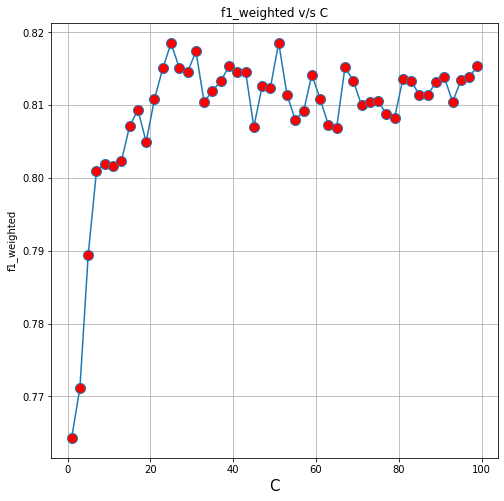

In [39]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 82.152%
Precision on test set: 0.659
Recall on test set: 0.633
F1-Score on test set: 0.644


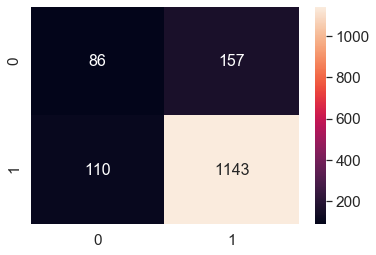

In [40]:
DT= DecisionTreeClassifier(max_depth=51)
fit = DT.fit(x_tr_uni,y_tr)
y_pred = DT.predict(x_test_uni)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Finding Maximum Depth using Random Search CV

In [41]:
myList = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0, myList))

DT = DecisionTreeClassifier()
max_depth = {'max_depth':depth}
gsv = RandomizedSearchCV(DT,max_depth,cv=5,verbose=1,scoring='f1_weighted')
gsv.fit(x_tr_uni,y_tr)

print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
optimal_C=gsv.best_score_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best HyperParameter:  {'max_depth': 21}
0.8161602340387875


In [42]:
# f1_weighted vs C graph

In [43]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.593294,0.060246,0.003431,0.003723,79,{'max_depth': 79},0.810232,0.810232,0.804363,0.809363,0.827846,0.812407,0.008022,4
1,0.254170,0.011150,0.003652,0.004519,17,{'max_depth': 17},0.816824,0.786352,0.803969,0.819894,0.815167,0.808441,0.012285,7
2,0.176621,0.004962,0.004079,0.004261,11,{'max_depth': 11},0.809689,0.793381,0.799779,0.811143,0.806683,0.804135,0.006650,8
3,0.544191,0.029945,0.002037,0.003143,71,{'max_depth': 71},0.809787,0.816843,0.810575,0.812393,0.816519,0.813223,0.002949,3
4,0.065851,0.004432,0.003652,0.004519,3,{'max_depth': 3},0.772108,0.765519,0.780824,0.771325,0.766256,0.771206,0.005480,10
5,0.146637,0.005407,0.004074,0.004255,9,{'max_depth': 9},0.809419,0.787530,0.797759,0.808137,0.807832,0.802136,0.008414,9
6,0.303399,0.029225,0.003421,0.003103,21,{'max_depth': 21},0.815750,0.809341,0.803058,0.823838,0.828815,0.816160,0.009353,1
7,0.581287,0.067652,0.006362,0.006025,67,{'max_depth': 67},0.805537,0.810788,0.801473,0.811984,0.814485,0.808853,0.004706,6
8,0.276342,0.015192,0.003647,0.004512,19,{'max_depth': 19},0.811454,0.799728,0.806137,0.817603,0.815167,0.810018,0.006435,5
9,0.401626,0.017182,0.004076,0.004262,35,{'max_depth': 35},0.814899,0.805077,0.808993,0.824815,0.821814,0.815120,0.007446,2


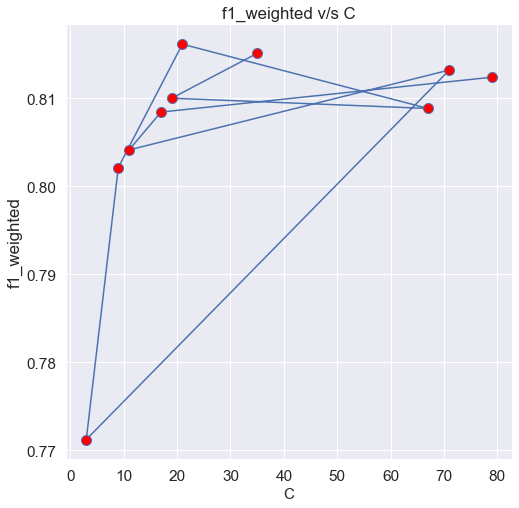

In [44]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

In [45]:
DT= DecisionTreeClassifier(max_depth=21)
fit = DT.fit(x_tr_uni,y_tr)
y_pred = DT.predict(x_test_uni)

Accuracy on test set: 83.155%
Precision on test set: 0.669
Recall on test set: 0.608
F1-Score on test set: 0.625


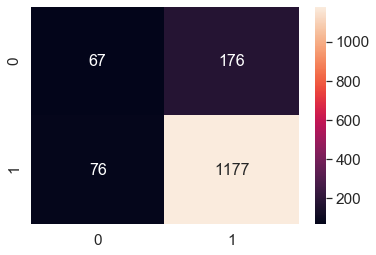

In [46]:
print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Feature Importance

In [47]:
DT = DecisionTreeClassifier()
DT.fit(x_tr_uni,y_tr)

DecisionTreeClassifier()

In [48]:
len(bow.get_feature_names())

10960

In [49]:
all_features = bow.get_feature_names()

feat=DT.feature_importances_
features=np.argsort(feat)[::-1]
for i in features[0:20]:
    print(all_features[i])

not
disappointed
great
love
money
list
use
no
unfortunately
refund
away
awful
worst
still
wo
disappointing
terrible
swiss
one
delicious


### Decision Tree Visualization

In [50]:
from six import StringIO     # In some cases, data reading and writing are not necessarily in files, but it needs to be read and written in memory. Python has a built-in module named StringIO. It can produce file-like objects (also known as memory files or string buffer) and be read and written just like files.
from IPython.display import Image  
from sklearn.tree import export_graphviz # This function generates a GraphViz representation of the decision tree, which is then written into out_file. Once exported, graphical renderings can be generated
import pydotplus            # PyDotPlus is an improved version of the old pydot project that provides a Python Interface to Graphviz's Dot language.

In [51]:
DT= DecisionTreeClassifier(max_depth=43)
fit=DT.fit(x_tr_uni,y_tr)

In [54]:
x_tr_uni

<3490x10960 sparse matrix of type '<class 'numpy.int64'>'
	with 109432 stored elements in Compressed Sparse Row format>

In [55]:
d = pd.DataFrame(x_tr_uni)

In [ ]:
d.describe()

In [52]:
f = StringIO()
f.write("Hello, Yang!")
print(f.getvalue())
# Hello, Yang!

Hello, Yang!


In [53]:
dot_data = StringIO()
export_graphviz(DT, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## 2. BOW

In [35]:


bi_gram = CountVectorizer(ngram_range=(1,2))
x_tr_bi = bi_gram.fit_transform(x_tr)
x_test_bi = bi_gram.transform(x_test)

### Finding Maximum Depth using GridSearch CV

In [37]:
grid = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0,grid))

dtree = DecisionTreeClassifier()
max_depth = [{'max_depth': depth}]
gsv = GridSearchCV(dtree,cv=5,param_grid = max_depth,scoring='f1_weighted')

gsv.fit(x_tr_bi,y_tr)
print("Best value of depth is" ,gsv.best_params_)
print("Best value of f1_weighted score is:",gsv.best_score_)

Best value of depth is {'max_depth': 33}
Best value of f1_weighted score is: 0.8258539376824918


In [38]:
# f1_weighted vs C graph

In [39]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.755006,0.075659,0.015651,0.024254,1,{'max_depth': 1},0.766311,0.766311,0.766311,0.764293,0.764293,0.765503,0.000989,50
1,0.803122,0.012484,0.006249,0.007654,3,{'max_depth': 3},0.797926,0.807445,0.797875,0.801350,0.789964,0.798912,0.005672,49
2,0.921167,0.024900,0.009378,0.007657,5,{'max_depth': 5},0.796527,0.808262,0.799427,0.805690,0.795871,0.801155,0.004968,48
3,1.034092,0.034324,0.006255,0.007661,7,{'max_depth': 7},0.800699,0.813883,0.804227,0.795751,0.800570,0.803026,0.006061,47
4,1.132466,0.015648,0.006250,0.007654,9,{'max_depth': 9},0.801240,0.816896,0.809233,0.814297,0.806817,0.809697,0.005532,46
5,1.234365,0.027951,0.006252,0.007657,11,{'max_depth': 11},0.800143,0.819734,0.814467,0.808851,0.805662,0.809771,0.006808,45
6,1.337501,0.036440,0.006249,0.007654,13,{'max_depth': 13},0.800143,0.828425,0.817269,0.817801,0.801204,0.812968,0.010804,42
7,1.419092,0.029514,0.006251,0.007656,15,{'max_depth': 15},0.807457,0.821890,0.814741,0.823032,0.805756,0.814575,0.007120,41
8,1.500008,0.040761,0.003126,0.006251,17,{'max_depth': 17},0.806624,0.825188,0.814968,0.829739,0.817900,0.818884,0.008052,23
9,1.581240,0.040004,0.006251,0.007656,19,{'max_depth': 19},0.809902,0.826280,0.818482,0.818925,0.814645,0.817647,0.005401,33


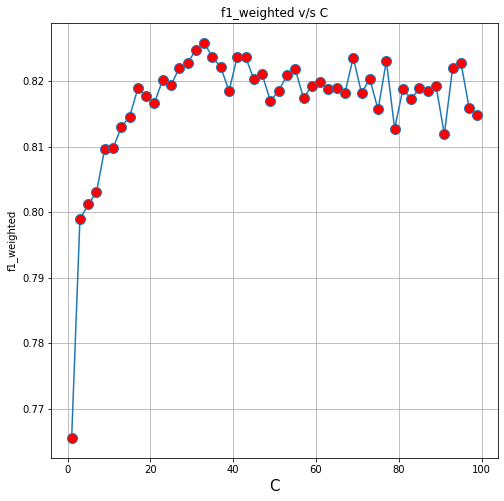

In [40]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 83.824%
Precision on test set: 0.696
Recall on test set: 0.645
F1-Score on test set: 0.664


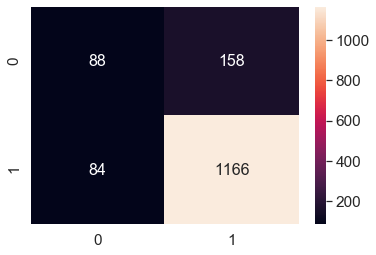

In [43]:
DT= DecisionTreeClassifier(max_depth=33)
fit = DT.fit(x_tr_bi,y_tr)
y_pred = DT.predict(x_test_bi)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Finding Maximum Depth using Random Search CV

In [44]:
myList = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0, myList))

DT = DecisionTreeClassifier()
max_depth = {'max_depth':depth}
gsv = RandomizedSearchCV(DT,max_depth,cv=5,verbose=1,scoring='f1_weighted')
gsv.fit(x_tr_bi,y_tr)

print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
optimal_C=gsv.best_score_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best HyperParameter:  {'max_depth': 23}
0.821571545011291


In [ ]:
# f1_weighted vs C graph

In [45]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,1.682825,0.116941,0.009388,0.007665,15,{'max_depth': 15},0.809735,0.822971,0.810305,0.822078,0.808137,0.814645,0.006479,8
1,0.854132,0.108018,0.006334,0.007758,1,{'max_depth': 1},0.766311,0.766311,0.766311,0.764293,0.764293,0.765503,0.000989,10
2,2.972728,0.209625,0.026255,0.026335,61,{'max_depth': 61},0.800708,0.820375,0.817510,0.821583,0.815685,0.815172,0.007525,7
3,3.530407,0.230342,0.012771,0.003613,77,{'max_depth': 77},0.807988,0.822972,0.826340,0.830386,0.815685,0.820674,0.007969,4
4,2.132505,0.026412,0.009377,0.007656,37,{'max_depth': 37},0.802749,0.823803,0.822833,0.819455,0.825109,0.818790,0.008236,5
5,2.820374,0.133627,0.007455,0.007031,63,{'max_depth': 63},0.816331,0.820193,0.817279,0.834886,0.814916,0.820721,0.007290,3
6,1.731808,0.049934,0.006249,0.007653,23,{'max_depth': 23},0.805744,0.817523,0.829512,0.836271,0.818807,0.821572,0.010523,1
7,1.248316,0.033459,0.000000,0.000000,11,{'max_depth': 11},0.801144,0.817618,0.822774,0.813587,0.803231,0.811671,0.008299,9
8,2.505106,0.110917,0.011779,0.004715,47,{'max_depth': 47},0.799731,0.823472,0.827675,0.836579,0.820397,0.821571,0.012203,2
9,3.160139,0.192043,0.016387,0.001497,79,{'max_depth': 79},0.803675,0.816720,0.822710,0.837634,0.808705,0.817889,0.011839,6


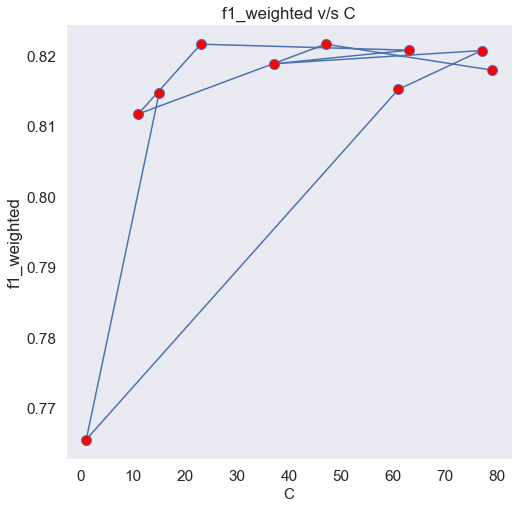

In [46]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 83.690%
Precision on test set: 0.689
Recall on test set: 0.617
F1-Score on test set: 0.637


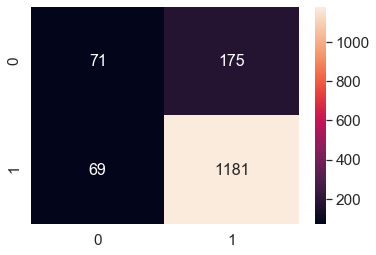

In [48]:
DT= DecisionTreeClassifier(max_depth=23)
fit = DT.fit(x_tr_bi,y_tr)
y_pred = DT.predict(x_test_bi)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Feature Importance

In [51]:
DT = DecisionTreeClassifier()
DT.fit(x_tr_bi,y_tr) 

all_features = bi_gram.get_feature_names()

feat=DT.feature_importances_
features=np.argsort(feat)[::-1]
for i in features[0:20]:
    print(all_features[i])

not
disappointed
awful
money
disappointing
misleading
return
great
love
terrible
not disappointed
weak
away
horrible
without
trash
one
good
worst
get


### Decision Tree Visualization

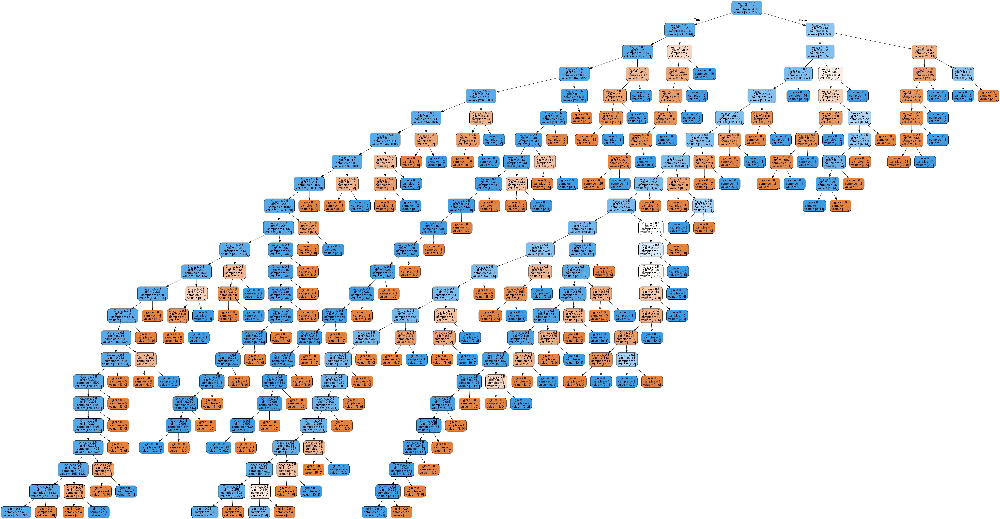

In [53]:
from six import StringIO    
from IPython.display import Image  
from sklearn.tree import export_graphviz 
import pydotplus 

DT= DecisionTreeClassifier(max_depth=23)
fit=DT.fit(x_tr_bi,y_tr)

dot_data = StringIO()
export_graphviz(DT, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

 ## 3. TF-IDF

In [54]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2))
x_tr_tfidf = tf_idf_vect.fit_transform(x_tr)
x_test_tfidf = tf_idf_vect.transform(x_test)

### Finding Maximum Depth using GridSearch CV

In [56]:
grid = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0,grid))

dtree = DecisionTreeClassifier()
max_depth = [{'max_depth': depth}]
gsv = GridSearchCV(dtree,cv=5,param_grid = max_depth,scoring='f1_weighted')

gsv.fit(x_tr_tfidf,y_tr)
print("Best value of depth is" ,gsv.best_params_)
print("Best value of f1_weighted score is:",gsv.best_score_)

Best value of depth is {'max_depth': 31}
Best value of f1_weighted score is: 0.8229795857392602


In [ ]:
# f1_weighted vs C graph

In [57]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.874611,0.192957,0.007853,0.012104,1,{'max_depth': 1},0.766311,0.784529,0.766311,0.764293,0.764293,0.769147,0.007744,50
1,0.913758,0.089677,0.007655,0.007003,3,{'max_depth': 3},0.776549,0.795859,0.786595,0.785638,0.778295,0.784587,0.006876,49
2,1.114166,0.104531,0.006118,0.005833,5,{'max_depth': 5},0.791070,0.793223,0.806655,0.800090,0.791162,0.796440,0.006078,48
3,1.091871,0.023409,0.001004,0.002008,7,{'max_depth': 7},0.798829,0.807004,0.809643,0.806271,0.799110,0.804171,0.004394,47
4,1.244301,0.048614,0.006773,0.005114,9,{'max_depth': 9},0.791368,0.811281,0.818482,0.802613,0.804643,0.805678,0.009062,46
5,1.312518,0.045048,0.005923,0.005772,11,{'max_depth': 11},0.791376,0.817416,0.818591,0.813397,0.806683,0.809493,0.009969,44
6,1.738731,0.391483,0.018852,0.012139,13,{'max_depth': 13},0.789458,0.822774,0.819770,0.810334,0.802953,0.809058,0.012049,45
7,2.591855,0.189487,0.010202,0.001721,15,{'max_depth': 15},0.793368,0.821929,0.821838,0.814641,0.804267,0.811209,0.011010,42
8,2.050608,0.351914,0.007592,0.001745,17,{'max_depth': 17},0.789882,0.830620,0.825020,0.813609,0.804050,0.812636,0.014623,40
9,2.095396,0.268044,0.007006,0.001091,19,{'max_depth': 19},0.795790,0.830416,0.826949,0.817814,0.810396,0.816273,0.012414,28


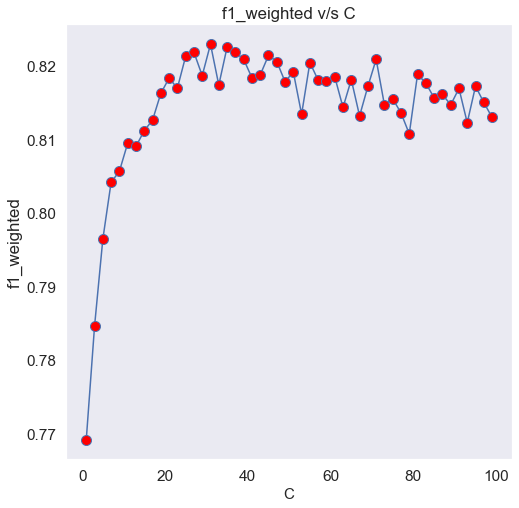

In [58]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 82.286%
Precision on test set: 0.672
Recall on test set: 0.659
F1-Score on test set: 0.665


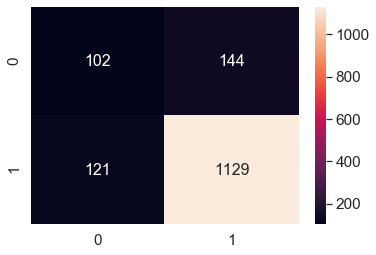

In [59]:
DT= DecisionTreeClassifier(max_depth=43)
fit = DT.fit(x_tr_tfidf,y_tr)
y_pred = DT.predict(x_test_tfidf)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

In [ ]:
# Feature Importance

In [63]:
DT = DecisionTreeClassifier()
DT.fit(x_tr_tfidf,y_tr) 
all_features = tf_idf_vect.get_feature_names()

feat=DT.feature_importances_
features=np.argsort(feat)[::-1]
for i in features[0:20]:
    print(all_features[i])

not
disappointed
waste
awful
disappointing
return
terrible
refund
plastic
misleading
weak
worst
threw
ingredient
best
thought
never buy
ingredients
stuck
contains


### Finding Maximum Depth using Random Search CV

In [65]:
myList = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0, myList))

In [66]:
DT = DecisionTreeClassifier()
max_depth = {'max_depth':depth}
gsv = RandomizedSearchCV(DT,max_depth,cv=5,verbose=1,scoring='f1_weighted')
gsv.fit(x_tr_tfidf,y_tr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'max_depth': [1, 3, 5, 7, 9, 11, 13, 15,
                                                      17, 19, 21, 23, 25, 27,
                                                      29, 31, 33, 35, 37, 39,
                                                      41, 43, 45, 47, 49, 51,
                                                      53, 55, 57, 59, ...]},
                   scoring='f1_weighted', verbose=1)

In [67]:
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
optimal_C=gsv.best_score_

Best HyperParameter:  {'max_depth': 43}
0.8225204821606658


In [ ]:
# f1_weighted vs C graph

In [68]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.561424,0.351923,0.006251,0.007656,61,{'max_depth': 61},0.811071,0.824086,0.830040,0.823020,0.806860,0.819015,0.008651,5
1,2.760478,0.074452,0.009386,0.007664,45,{'max_depth': 45},0.823035,0.833022,0.832989,0.811319,0.802436,0.820560,0.012081,3
2,3.768778,0.500923,0.009366,0.007648,69,{'max_depth': 69},0.807270,0.821154,0.825183,0.814591,0.795235,0.812687,0.010634,8
3,3.694353,0.054278,0.006250,0.007654,77,{'max_depth': 77},0.813845,0.841506,0.827422,0.817483,0.797735,0.819598,0.014538,4
4,0.715637,0.015314,0.006246,0.007649,1,{'max_depth': 1},0.766311,0.784529,0.766311,0.764293,0.764293,0.769147,0.007744,10
5,2.310651,0.143646,0.003127,0.006254,31,{'max_depth': 31},0.818489,0.837926,0.831867,0.816780,0.804992,0.822011,0.011661,2
6,3.977113,0.181770,0.006252,0.007657,93,{'max_depth': 93},0.806193,0.816619,0.819320,0.798353,0.792534,0.806604,0.010278,9
7,3.937498,0.142521,0.003127,0.006254,99,{'max_depth': 99},0.805119,0.825582,0.826308,0.810011,0.803818,0.814167,0.009838,7
8,2.679943,0.088708,0.009385,0.012517,43,{'max_depth': 43},0.818203,0.831072,0.835277,0.821052,0.806999,0.822520,0.009976,1
9,2.381259,0.056416,0.003124,0.006248,35,{'max_depth': 35},0.816331,0.829630,0.829630,0.819693,0.790657,0.817188,0.014287,6


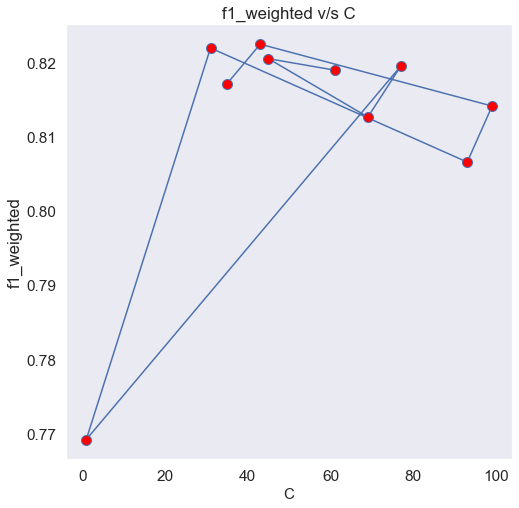

In [69]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 83.356%
Precision on test set: 0.690
Recall on test set: 0.664
F1-Score on test set: 0.675


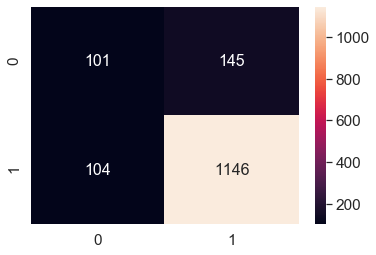

In [71]:
DT= DecisionTreeClassifier(max_depth=43)
fit = DT.fit(x_tr_tfidf,y_tr)
y_pred = DT.predict(x_test_tfidf)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Feature Importance

In [74]:
DT = DecisionTreeClassifier()
DT.fit(x_tr_tfidf,y_tr) 

all_features = tf_idf_vect.get_feature_names()

feat=DT.feature_importances_
features=np.argsort(feat)[::-1]
for i in features[0:20]:
    print(all_features[i])

not
disappointed
awful
waste
disappointing
return
terrible
ingredient
refund
misleading
weak
worst
threw
thought
swiss miss
plastic
reviews
never buy
great
ingredients


### Decision Tree Visualization

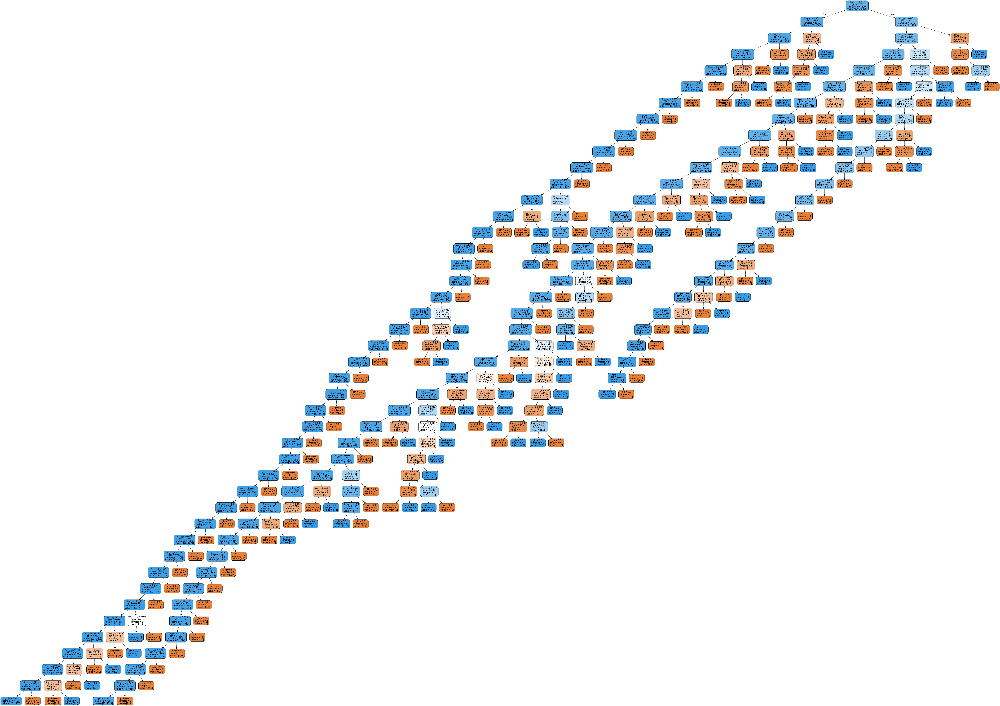

In [77]:
DT= DecisionTreeClassifier(max_depth=43)
fit=DT.fit(x_tr_tfidf,y_tr)

from six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

dot_data = StringIO()
export_graphviz(DT, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## Word2Vec

In [37]:
i=0
list_of_sent=[]
for sent in x_tr:
    list_of_sent.append(sent.split())
i=0
list_of_sent_test=[]
for sent in x_test:
    list_of_sent_test.append(sent.split())

In [38]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [39]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  3170
sample words  ['daughter', 'says', 'best', 'hot', 'chocolate', 'ever', 'love', 'no', 'spilled', 'tried', 'kona', 'much', 'cheaper', 'brands', 'using', 'say', 'greatly', 'surprised', 'mild', 'bite', 'acidity', 'shopping', 'list', 'not', 'sweet', 'right', 'allergy', 'free', 'food', 'great', 'book', 'hope', 'non', 'ingredients', 'contains', 'corn', 'thats', 'however', 'dont', 'appreciate', 'fact', 'opened', 'new', 'box', 'cut', 'size', 'less', 'charge', 'effect', 'decision']


## 4. Avg W2V

In [40]:
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: 
    sent_vec = np.zeros(50)
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

3490
50


In [41]:
sent_vectors_test = []
for sent in list_of_sent_test: 
    sent_vec = np.zeros(50) 
    cnt_words =0; 
    for word in sent: 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)
print(len(sent_vectors_test))
print(len(sent_vectors_test[0]))

1496
50


In [42]:
x_tr_av1 = sent_vectors
x_test_av1 = sent_vectors_test

### Finding Maximum Optimal Depth using GridSearch CV

In [86]:
grid = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0,grid))

dtree = DecisionTreeClassifier()
max_depth = [{'max_depth': depth}]
gsv = GridSearchCV(dtree,cv=5,param_grid = max_depth,scoring='f1_weighted')

gsv.fit(x_tr_av1,y_tr)
print("Best value of depth is" ,gsv.best_params_)
print("Best value of f1_weighted score is:",gsv.best_score_)

Best value of depth is {'max_depth': 5}
Best value of f1_weighted score is: 0.7690146538582632


In [ ]:
# f1_weighted vs C graph

In [87]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.042468,0.017831,0.004202,0.001469,1,{'max_depth': 1},0.766311,0.766311,0.766311,0.764293,0.764293,0.765503,0.000989,2
1,0.074531,0.006479,0.001201,0.001594,3,{'max_depth': 3},0.765599,0.763837,0.769846,0.762869,0.764780,0.765386,0.002410,3
2,0.113485,0.008242,0.000600,0.001201,5,{'max_depth': 5},0.776102,0.763837,0.771914,0.768193,0.765027,0.769015,0.004517,1
3,0.144855,0.007007,0.003725,0.006049,7,{'max_depth': 7},0.767737,0.755538,0.762011,0.770370,0.758011,0.762733,0.005620,4
4,0.171835,0.000064,0.009416,0.007688,9,{'max_depth': 9},0.762216,0.754513,0.757722,0.768388,0.763109,0.761190,0.004757,5
5,0.223416,0.050706,0.005725,0.005954,11,{'max_depth': 11},0.761062,0.779246,0.754246,0.761498,0.737803,0.758771,0.013357,6
6,0.210745,0.009594,0.003125,0.006251,13,{'max_depth': 13},0.761309,0.753469,0.753582,0.747851,0.735414,0.750325,0.008597,7
7,0.234373,0.009899,0.000000,0.000000,15,{'max_depth': 15},0.749631,0.744137,0.746345,0.746766,0.730570,0.743490,0.006692,22
8,0.232904,0.018640,0.000000,0.000000,17,{'max_depth': 17},0.765965,0.757416,0.727865,0.739119,0.735427,0.745159,0.014236,13
9,0.228133,0.012522,0.000000,0.000000,19,{'max_depth': 19},0.753964,0.739585,0.740888,0.738288,0.725209,0.739587,0.009130,37


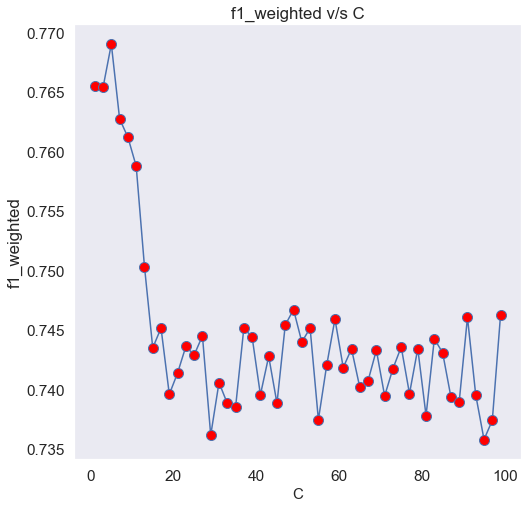

In [88]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 73.797%
Precision on test set: 0.532
Recall on test set: 0.533
F1-Score on test set: 0.532


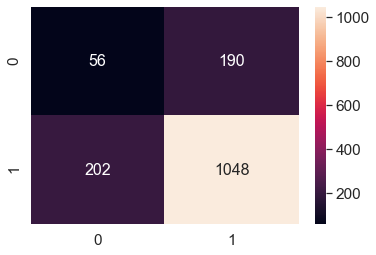

In [89]:
DT= DecisionTreeClassifier(max_depth=43)
fit = DT.fit(x_tr_av1,y_tr)
y_pred = DT.predict(x_test_av1)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale = 1.4)
sns.heatmap(df_cm, annot = True, annot_kws = {"size": 16}, fmt='g')

### Finding the optimal Depth using RandomSearchCv

In [43]:
myList = list(range(0,100))
depth = list(filter(lambda x: x % 2 != 0, myList))
DT = DecisionTreeClassifier()
max_depth = {'max_depth':depth}
gsv = RandomizedSearchCV(DT,max_depth,cv=5,verbose=1,scoring='f1_weighted')
gsv.fit(x_tr_av1,y_tr)
print("Best HyperParameter: ",gsv.best_params_)
print(gsv.best_score_)
optimal_C=gsv.best_score_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best HyperParameter:  {'max_depth': 5}
0.7739359633532369


In [ ]:
# f1_weighted vs C graph

In [45]:
dic = pd.DataFrame(gsv.cv_results_) 
dic

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.226872,0.019511,0.013024,0.023070,57,{'max_depth': 57},0.732723,0.756561,0.754881,0.738689,0.742040,0.744979,0.009280,8
1,0.210989,0.014671,0.003640,0.003695,37,{'max_depth': 37},0.734905,0.753454,0.750361,0.742815,0.747470,0.745801,0.006477,4
2,0.210712,0.014380,0.005162,0.006032,73,{'max_depth': 73},0.734713,0.747851,0.747302,0.752295,0.742274,0.744887,0.005997,10
3,0.118206,0.027812,0.004575,0.003282,5,{'max_depth': 5},0.790934,0.781173,0.761137,0.773729,0.762707,0.773936,0.011236,1
4,0.248254,0.050917,0.002434,0.002966,41,{'max_depth': 41},0.732238,0.749464,0.745824,0.748467,0.751459,0.745491,0.006871,5
5,0.210460,0.014130,0.004053,0.004248,39,{'max_depth': 39},0.734713,0.750604,0.750064,0.741669,0.748858,0.745182,0.006143,7
6,0.215095,0.015236,0.000416,0.000833,95,{'max_depth': 95},0.741484,0.749816,0.745263,0.746472,0.748467,0.746301,0.002876,2
7,0.218004,0.014967,0.004462,0.004684,81,{'max_depth': 81},0.735707,0.752589,0.738120,0.743655,0.754694,0.744953,0.007577,9
8,0.218368,0.024415,0.007272,0.003750,17,{'max_depth': 17},0.730143,0.755713,0.751100,0.746472,0.742815,0.745249,0.008710,6
9,0.212410,0.013026,0.004450,0.004671,31,{'max_depth': 31},0.728171,0.756644,0.741493,0.752456,0.752663,0.746285,0.010365,3


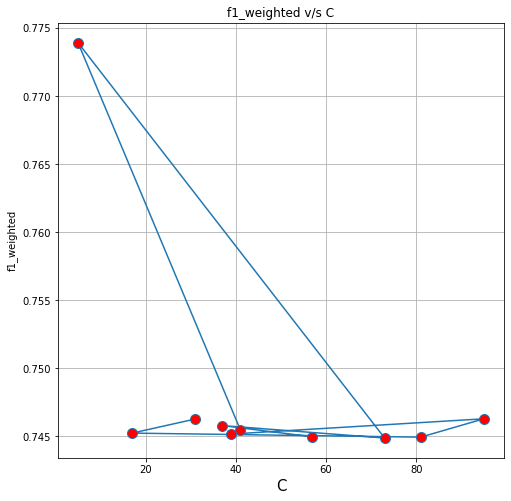

In [47]:
plt.figure(figsize=(8,8))

x = dic['param_max_depth']
y = dic['mean_test_score']

plt.xlabel("C",fontsize=15)
plt.ylabel("f1_weighted")
plt.title('f1_weighted v/s C')
plt.plot(x,y, marker='o', markerfacecolor='red', markersize=10)
plt.grid()
plt.show()

### Finding the Accuracy, F1 - score in Test Data using Optimal MaxDepth

Accuracy on test set: 75.201%
Precision on test set: 0.542
Recall on test set: 0.542
F1-Score on test set: 0.542


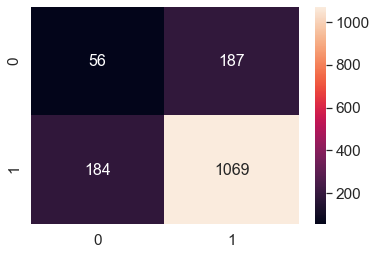

In [48]:
DT= DecisionTreeClassifier(max_depth=19)
DT.fit(x_tr_av1,y_tr)
y_pred =DT.predict(x_test_av1)

print("Accuracy on test set: %0.3f%%"%(accuracy_score(y_test, y_pred)*100))
print("Precision on test set: %0.3f"%(precision_score(y_test, y_pred,average='macro')))
print("Recall on test set: %0.3f"%(recall_score(y_test, y_pred,average='macro')))
print("F1-Score on test set: %0.3f"%(f1_score(y_test, y_pred,average='macro')))

df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), range(2),range(2))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt='g')

### Decision Tree visualisation

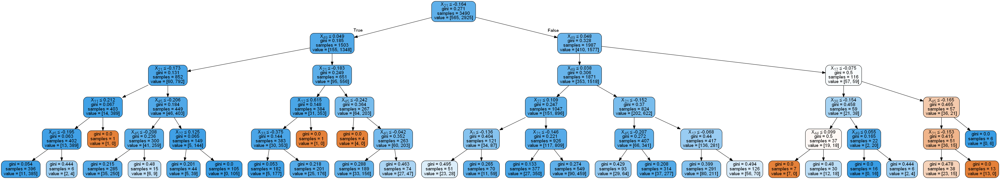

In [49]:
from six import StringIO    
from IPython.display import Image  
from sklearn.tree import export_graphviz 
import pydotplus 

DT= DecisionTreeClassifier(max_depth = 5)
fit=DT.fit(x_tr_av1,y_tr)

dot_data = StringIO()
export_graphviz(DT, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

## Summary

| Model | Optimal value for depth   |F1score test|Accuracy Test
|------|------|------|------|
|  unigram  | 51| 0.644|82.15%|
| Bi-gram | 33|0.664| 83.82%|
|  Tf-IDF | 31|0.665| 82.28%
   | Av-Word2Vec | 5| 0.542| 75.20%|